##**Check GPU**
Mixed precision is the use of both 16-bit and 32-bit floating-point types in a model during training to make it run faster and use less memory.

Inorder to use mixed precision training we need to access to a Tesla T4 or if we are using our own hardware, our GPU needs a score of 7.0+



In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-6a196f18-6e14-c697-f520-cd6e8077ac59)


In [ ]:
# Get tensorflow datasets
import tensorflow_datasets as tfds
datasets = tfds.list_builders() # Get all available datasets in TFDS
print('food101' in datasets) #  checking for food101 datasets

True


In [ ]:
print(datasets)

['abstract_reasoning', 'accentdb', 'aeslc', 'aflw2k3d', 'ag_news_subset', 'ai2_arc', 'ai2_arc_with_ir', 'amazon_us_reviews', 'anli', 'answer_equivalence', 'arc', 'asqa', 'asset', 'assin2', 'bair_robot_pushing_small', 'bccd', 'beans', 'bee_dataset', 'beir', 'big_patent', 'bigearthnet', 'billsum', 'binarized_mnist', 'binary_alpha_digits', 'ble_wind_field', 'blimp', 'booksum', 'bool_q', 'bucc', 'c4', 'c4_wsrs', 'caltech101', 'caltech_birds2010', 'caltech_birds2011', 'cardiotox', 'cars196', 'cassava', 'cats_vs_dogs', 'celeb_a', 'celeb_a_hq', 'cfq', 'cherry_blossoms', 'chexpert', 'cifar10', 'cifar100', 'cifar100_n', 'cifar10_1', 'cifar10_corrupted', 'cifar10_n', 'citrus_leaves', 'cityscapes', 'civil_comments', 'clevr', 'clic', 'clinc_oos', 'cmaterdb', 'cnn_dailymail', 'coco', 'coco_captions', 'coil100', 'colorectal_histology', 'colorectal_histology_large', 'common_voice', 'conll2002', 'conll2003', 'controlled_noisy_web_labels', 'coqa', 'cos_e', 'cosmos_qa', 'covid19', 'covid19sum', 'crema_d

In [ ]:
from google.colab import files
files.upload()

Saving archive (3).zip to archive (3).zip


{'archive (3).zip': b'PK\x03\x04-\x00\x00\x00\x08\x00p.\xd4R\x94\x7f\xeaM\xff\xff\xff\xff\xff\xff\xff\xff\x1c\x00\x14\x00Soil types/Black Soil/10.jpg\x01\x00\x10\x00\xe4\xe8\x00\x00\x00\x00\x00\x00h\xa1\x00\x00\x00\x00\x00\x00\xec\xbagTS[\xdb.\x1c\x04E\xb7\x85-\x82\xc2\xa6)\xa0(U\x8a\xf4\x80n\xa5\t\x82\xa2\x01\x91\xa6\xf4\x16B(\t!@Dlt\x01\x03\x9bb\xb0P\xa4KK\x80\x00\x81\xad\xf4\x12\xa5C\x08Q \x89\x94$\x10J\x0c\x81\xf0\xf1<\xe7}\xde\xf7\xc7w~\x9c\xef\xfb{\xf6\xb5\xc6\xc8\xba\xe7\xcc\x1c+\xeb\xba\xc7\xcc}_\xd7\x1akor\xef;\xe0\xf7\x9b\xe6V\xe6\x00\x01\x01\x01\xc0\xc3\xfd\x03\xb0\xf7\x03\xf4\xcb,\xd2\xdf\x07\x00\xb8u\x0b\xa0\x0c\x00\x00\x0e\x03\x0e\x01\x8e\x02\x0e\xecG\x17\xf6\x07\x1e\x02\xa2\x00\xc1\xfdX`\xff\x00\x08h\xfe\xf7\xfcK\x01\xad\x7f\xc7b\xfbq\xd5\x0b\x7f\x80\xd0\xbf\xd7\x00\x0e\xff\xbd$\r\x10\xde?\x1f\xdb\x1f;\x00\x00\'\xcd\xa5\x97\xfe}\xcd\x7f\xf0\x0f\xfe\xc1?\xf8\x07\xff\xe0\x1f\xfc_\nG\xff`/\x08<\xec\xecm?H8\xe4\xac\x99\x97\x7f8$\xf4\xac\xe6e\xf5\xcb\xea\x9a\x97/kj\xaak\xeaj\

In [ ]:
import zipfile
data = zipfile.ZipFile('/content/archive (3).zip')
data.extractall()

In [ ]:
(train_data,test_data),ds_info = tfds.load('food101',
                                           split=['train','validation'],
                                           shuffle_files=True,
                                           as_supervised=True,
                                           with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incomplete1HDVJ4/food101-train.tfrecord*...:   0%|          …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incomplete1HDVJ4/food101-validation.tfrecord*...:   0%|     …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [ ]:
!pip install -q kaggle


In [ ]:
from google.colab import files
files.upload()

##Exploring the data
To become on with the data
* class names
* The shape of the input data
* The datatype of our input data
* What the labels lokk like
* DO the labels match up with the class names ?

In [ ]:
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [ ]:
class_names = (ds_info.features['label'].names)

In [ ]:
train_one_sample = train_data.take(1)
print(train_one_sample)

<TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [ ]:
for image,label in train_one_sample:
  print(f"""
  Image Shape:                {image.shape}
  Image Datatype:             {image.dtype}
  Target class (tensor Form): {label}
  Class name :                {class_names[label]}

  """)


  Image Shape:                (512, 512, 3)
  Image Datatype:             <dtype: 'uint8'>
  Target class (tensor Form): 77
  Class name :                pork_chop

  


In [ ]:
image

<tf.Tensor: shape=(512, 512, 3), dtype=uint8, numpy=
array([[[ 64,  27,  11],
        [ 73,  36,  20],
        [ 83,  46,  28],
        ...,
        [150, 105,  82],
        [138,  93,  72],
        [134,  89,  68]],

       [[ 69,  32,  16],
        [ 70,  33,  17],
        [ 72,  35,  17],
        ...,
        [155, 110,  87],
        [141,  96,  75],
        [135,  90,  69]],

       [[ 71,  35,  19],
        [ 65,  29,  13],
        [ 61,  26,   7],
        ...,
        [162, 118,  93],
        [144, 102,  78],
        [137,  95,  71]],

       ...,

       [[210,  82,  21],
        [208,  80,  19],
        [205,  77,  14],
        ...,
        [223, 172, 115],
        [226, 175, 118],
        [224, 173, 116]],

       [[199,  71,   8],
        [199,  71,   8],
        [198,  70,   7],
        ...,
        [224, 173, 116],
        [226, 175, 118],
        [223, 172, 115]],

       [[204,  76,  13],
        [204,  76,  13],
        [203,  75,  12],
        ...,
        [225, 174, 11

In [ ]:
# Min and Max values of the Image tensor
import tensorflow as tf
tf.reduce_min(image), tf.reduce_max(image)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

(-0.5, 511.5, 511.5, -0.5)

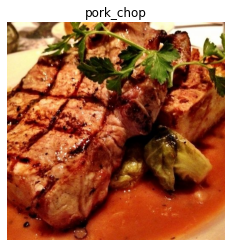

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label])
plt.axis(False)


##Create preprocessing Functions for our data

Neural Networks perform best when data is in a certain way ( Batched, Normalized ).

So, In order to get the data ready for a neural network, We have to write the preprocessing functions and map it to the data.

Our data:
* In 'unit8' DataType
* Comprised of all different size tensors( different sized images)
* Not Scaled( pixels values are between 0 & 255)


A model could be in:
* Data in 'float32' Dtype
* For batches, TensorFlow likes all of the tensors withnin a batch to be the same size
* scaled ( values between 0 & 1 ) { Normalized }

i.e, The function we are building needs to:
1. Reshape our images to all same size
2. Convert the dtype of all the image from unit8 to float 32


In [ ]:
def preprocess_img(image,label,img_shape =224):
  image = tf.image.resize(image,[img_shape,img_shape])
  #image = image/255. #scaling
  return tf.cast(image,tf.float32), label

In [ ]:
# Check the above function by preprocessing a single sample
preprocessed_img = preprocess_img(image,label)
print(f'Image before preprocessing:\n {image[:2]}..\nShape:{image.shape},\nDataType:{image.dtype}\n')
print(f'Image after Preprocessing :\n{preprocessed_img[0][:2]}..\nshape:{preprocessed_img[0].shape}\nDataType:{preprocessed_img[0].dtype}')




Image before preprocessing:
 [[[ 64  27  11]
  [ 73  36  20]
  [ 83  46  28]
  ...
  [150 105  82]
  [138  93  72]
  [134  89  68]]

 [[ 69  32  16]
  [ 70  33  17]
  [ 72  35  17]
  ...
  [155 110  87]
  [141  96  75]
  [135  90  69]]]..
Shape:(512, 512, 3),
DataType:<dtype: 'uint8'>

Image after Preprocessing :
[[[ 69.69388    32.69388    16.693878 ]
  [ 78.44898    41.44898    22.520409 ]
  [ 78.35204    42.566326   16.137754 ]
  ...
  [211.34154   166.91301   141.69875  ]
  [172.38239   127.382385  104.382385 ]
  [138.04063    93.040634   72.040634 ]]

 [[ 63.693874   28.290815   10.499998 ]
  [ 60.137756   25.137754    3.2857132]
  [ 68.54082    33.484695    5.198978 ]
  ...
  [208.20901   164.19371   136.76518  ]
  [184.3518    140.48448   113.76002  ]
  [146.6731    104.673096   79.74452  ]]]..
shape:(224, 224, 3)
DataType:<dtype: 'float32'>


##Batch & prepare datasets
We're now going to make our data input pipeline run really fast



In [ ]:
train_data

<PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
# Map preprocessing function to training data (and paralellize)
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
# Shuffle train_data and turn it into batches and prefetch it (load it faster)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

# Map prepreprocessing function to test data
test_data = test_data.map(preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
# Turn test data into batches (don't need to shuffle)
test_data = test_data.batch(32).prefetch(tf.data.AUTOTUNE)



In [ ]:
train_data,test_data

(<PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

##Create modelling callbacks
* TensorBoard callback to log training results .
* ModelCheckPoint Callback to save our models's progress after the feature extraction.


In [ ]:
import datetime as dt
import tensorflow as tf

# TensorBoard call back

def tensorBoard_callback(dir_name,experiment_name):
  log_dir = dir_name+'/'+'experiment_name'+dt.datetime.now().strftime('%Y%m%d-%H%M%S')
  tensor_board_call_back = tf.keras.callbacks.TensorBoard(
      log_dir = log_dir
  )
  print(f'Saving Tensorflow log files to: {log_dir}')
  return tensor_board_call_back

# ModelCheckpoint_callBack
path = 'model_checkpoint/cp.kmkg'
model_checkPoint = tf.keras.callbacks.ModelCheckpoint(path,
                                   monitor='val_accuracy',
                                   verbose=0,
                                   save_best_only=True,
                                   save_weights_only=True)

In [ ]:
tf.__version__

'2.11.0'

In [ ]:
# Mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')


In [ ]:
from tensorflow.keras import layers

# Create base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False # freeze base model layers

# Create Functional model
inputs = layers.Input(shape=input_shape, name="input_layer")
# Note: EfficientNetBX models have rescaling built-in but if your model didn't you could have a layer like below
# x = layers.Rescaling(1./255)(x)
x = base_model(inputs, training=False) # set base_model to inference mode only
x = layers.GlobalAveragePooling2D(name="pooling_layer")(x)
x = layers.Dense(len(class_names))(x) # want one output neuron per class
# Separate activation of output layer so we can output float32 activations
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_float32")(x)
model = tf.keras.Model(inputs, outputs)

# Compile the model
model.compile(loss="sparse_categorical_crossentropy", # Use sparse_categorical_crossentropy when labels are *not* one-hot
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])



16705208/16705208 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 pooling_layer (GlobalAverag  (None, 1280)             0         
 ePooling2D)                                                     
                                                                 
 dense (Dense)               (None, 101)               129381    
                                                                 
 softmax_float32 (Activation  (None, 101)              0         
 )                                                               
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [ ]:
for layer in model.layers:
  print(f'{layer.name} : {layer.dtype} __ {layer.trainable} __ {layer.dtype_policy}')

input_layer : float32 __ True __ <Policy "float32">
efficientnetb0 : float32 __ False __ <Policy "mixed_float16">
pooling_layer : float32 __ True __ <Policy "mixed_float16">
dense : float32 __ True __ <Policy "mixed_float16">
softmax_float32 : float32 __ True __ <Policy "float32">


In [ ]:
# Fit the feature extraction model with callbacks
history_1 = model.fit(train_data,
                                                     epochs=3,
                                                     steps_per_epoch=len(train_data),
                                                     validation_data=test_data,
                                                     validation_steps=int(0.15 * len(test_data)),
                                                     callbacks=[tensorBoard_callback("training_logs",
                                                                                            "efficientnetb0_101_classes_all_data_feature_extract"),
                                                                model_checkPoint])

Saving Tensorflow log files to: training_logs/experiment_name20230224-051952


Epoch 1/3
2368/2368 [==============================] - 197s 82ms/step - loss: 0.9596 - accuracy: 0.7473 - val_loss: 0.9792 - val_accuracy: 0.7219
Epoch 2/3
2368/2368 [==============================] - 190s 79ms/step - loss: 0.8892 - accuracy: 0.7657 - val_loss: 0.9671 - val_accuracy: 0.7325
Epoch 3/3
2368/2368 [==============================] - 193s 80ms/step - loss: 0.8332 - accuracy: 0.7797 - val_loss: 0.9658 - val_accuracy: 0.7304


In [ ]:
history_1.history

{'loss': [1.7213143110275269, 1.199963927268982, 1.0539898872375488],
 'accuracy': [0.5822838544845581, 0.6881452202796936, 0.7226006388664246],
 'val_loss': [1.1312543153762817, 1.030694842338562, 1.0026042461395264],
 'val_accuracy': [0.6970338821411133, 0.7171609997749329, 0.7229872941970825]}

In [ ]:
history_1.history['val_loss']


[1.1312543153762817, 1.030694842338562, 1.0026042461395264]

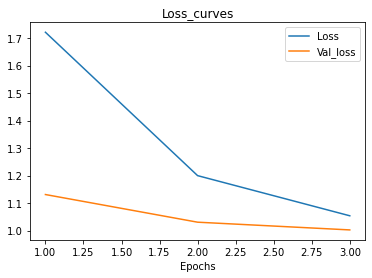

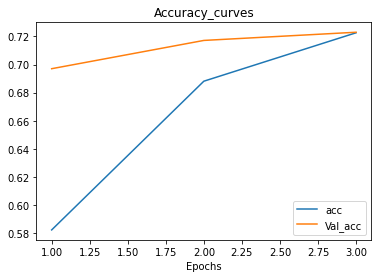

In [ ]:
import matplotlib.pyplot as plt

def plot_curves(History):
  loss = History.history['loss']
  acc = History.history['accuracy']
  val_acc = History.history['val_accuracy']
  val_loss = History.history['val_loss']
  epochs = range(1,len(val_loss)+1)
  # Plotting losses
  plt.plot(epochs,loss,epochs,val_loss)
  plt.legend(['Loss','Val_loss'])
  plt.xlabel('Epochs')
  plt.title('Loss_curves')
  plt.show()

  # Plotting accuracy
  plt.plot(epochs,acc,epochs,val_acc)
  plt.legend(['acc','Val_acc'])
  plt.xlabel('Epochs')
  plt.title('Accuracy_curves')
  plt.show()

plot_curves(history_1)


##Fine tuning
In the fine tuning, Let us Fine tune the last 20 layers of the Efficient_net layers

In [ ]:
for layers in  model.layers[1].layers:
  print(layers.name)

input_1
rescaling
normalization
rescaling_1
stem_conv_pad
stem_conv
stem_bn
stem_activation
block1a_dwconv
block1a_bn
block1a_activation
block1a_se_squeeze
block1a_se_reshape
block1a_se_reduce
block1a_se_expand
block1a_se_excite
block1a_project_conv
block1a_project_bn
block2a_expand_conv
block2a_expand_bn
block2a_expand_activation
block2a_dwconv_pad
block2a_dwconv
block2a_bn
block2a_activation
block2a_se_squeeze
block2a_se_reshape
block2a_se_reduce
block2a_se_expand
block2a_se_excite
block2a_project_conv
block2a_project_bn
block2b_expand_conv
block2b_expand_bn
block2b_expand_activation
block2b_dwconv
block2b_bn
block2b_activation
block2b_se_squeeze
block2b_se_reshape
block2b_se_reduce
block2b_se_expand
block2b_se_excite
block2b_project_conv
block2b_project_bn
block2b_drop
block2b_add
block3a_expand_conv
block3a_expand_bn
block3a_expand_activation
block3a_dwconv_pad
block3a_dwconv
block3a_bn
block3a_activation
block3a_se_squeeze
block3a_se_reshape
block3a_se_reduce
block3a_se_expand
blo

In [ ]:
# Checking for last 20 layers ...
for layers in model.layers[1].layers[-20:]:
  print(f'{layers.name} -> trainable : {layers.trainable}')

block6d_project_conv -> trainable : True
block6d_project_bn -> trainable : True
block6d_drop -> trainable : True
block6d_add -> trainable : True
block7a_expand_conv -> trainable : True
block7a_expand_bn -> trainable : True
block7a_expand_activation -> trainable : True
block7a_dwconv -> trainable : True
block7a_bn -> trainable : True
block7a_activation -> trainable : True
block7a_se_squeeze -> trainable : True
block7a_se_reshape -> trainable : True
block7a_se_reduce -> trainable : True
block7a_se_expand -> trainable : True
block7a_se_excite -> trainable : True
block7a_project_conv -> trainable : True
block7a_project_bn -> trainable : True
top_conv -> trainable : True
top_bn -> trainable : True
top_activation -> trainable : True


In [ ]:
# Unfreezing the layers
for layers in model.layers[1].layers[-20:]:
  layers.trainable = True